**PIPELINE**

Pipeline
O pipeline em ciência de dados é uma sequência de etapas estruturadas para coletar, processar, e analisar dados com o objetivo de obter insights e modelos preditivos. Esse fluxo de trabalho organiza e padroniza o processo, aumentando a eficiência e facilitando a manutenção e a escalabilidade dos projetos de ciência de dados.

Etapa 01: Instalar e Importar as Bibliotecas

Etapa 02: Obter o Datasource

Etapa 03: Exibir os Dados, Metadados e Estatísticas

Etapa 04: Extract, Transform, Load (ETL)

Etapa 05: Exploratory Data Analysis (EDA)

Etapa 06: Identificação e Remoção dos Outliers

Etapa 07: Preprocess

Etapa 08: Balanceamento dos Dados

Etapa 09: Separação dos Dados para Treinamento/Teste e Validação

Etapa 10: Treinamento dos Modelos

Etapa 11: Produção

***LOGISTICA***

## Definição dos Atributos

*ID_Produto*: Identificador único de cada produto. Esse campo permite rastrear as demandas e entregas associadas a produtos específicos, essencial para gerenciar o estoque e analisar a popularidade de cada item.

*Data_Entrega*: Data prevista para a entrega do produto. Esse campo é útil para análises de tempo de entrega, agendamento de transporte e controle de estoque em períodos específicos.

*Quantidade_Demandada*: Número de unidades do produto solicitadas para entrega. Esse valor é crucial para planejar estoques e evitar tanto o excesso quanto a falta de produtos.

*Estoque_Atual*: Quantidade do produto atualmente disponível no estoque. Esse campo permite analisar a disponibilidade e determinar a necessidade de reabastecimento com base na demanda.

*Recomendacao_Reposicao*: Indicador (Sim/Não) que informa se é recomendada a reposição do produto. A reposição é sugerida para produtos com baixa disponibilidade em estoque.

*Capacidade_Armazem*: Capacidade total de armazenamento do armazém onde o produto está localizado. Esse valor ajuda a entender os limites de armazenamento e a planejar expansões, se necessário.

*Espaco_Disponivel*: Quantidade de espaço disponível no armazém para novos itens. Esse campo é útil para prever a necessidade de reorganização ou expansão do armazenamento.

*Rota_Entrega*: Identificação da rota utilizada para a entrega do produto. As rotas, nomeadas como Rota A, Rota B, etc., permitem monitorar e otimizar os percursos para reduzir custos e tempo de entrega.

*Distancia_km*: Distância, em quilômetros, entre o armazém e o destino final. Esse campo permite analisar a eficiência das rotas de entrega e ajustar percursos para reduzir distâncias percorridas.

*Tempo_Entrega_horas*: Tempo previsto, em horas, para a entrega do produto. O tempo de entrega é útil para medir a eficiência de cada rota e identificar possíveis gargalos.

*Custo_Entrega*: Custo estimado para a entrega. Esse valor é fundamental para entender o impacto financeiro das entregas e ajustar estratégias de otimização de custos.

*Atraso_Entrega*: Indica se houve atraso na entrega (Verdadeiro/Falso). Esse campo permite identificar entregas fora do prazo e investigar causas para mitigar atrasos futuros.

*Desvio_Rota*: Indica se houve um desvio de rota durante a entrega (Verdadeiro/Falso). Esse campo ajuda a detectar anomalias no transporte e a evitar desvios indesejados que possam aumentar custos ou atrasos.

# ***Etapa 1: Instalar e Importar as Bibliotecas***

In [ ]:
## Etapa 1: Instalar e Importar as Bibliotecas

# Importar bibliotecas
try:
  import gdown
except ImportError:
  !pip install gdown
  import gdown
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
from sklearn.ensemble import IsolationForest
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
from sklearn.utils import resample
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV, StratifiedKFold, cross_val_score, train_test_split
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier

# Etapa 2: Obter o Datasource

In [ ]:
# --- Etapa 02: Obter o Datasource (logistica.csv) ---
try:
    dataset = pd.read_csv("logistica.csv", sep=';')
    print("Dados carregados com sucesso no DataFrame 'dataset'!")
except FileNotFoundError:
    print("ERRO: Certifique-se de que o arquivo 'folha.csv' está na pasta correta.")

Dados carregados com sucesso no DataFrame 'dataset'!


# Etapa 03: Exibir os Dados, Metadados e Estatísticas

In [ ]:
# Explorar os metadados do dataset
print("Exploração dos Metadados do Dataset")
# Exibir o DataFrame
print("Dados do Dataset:")
print(dataset.head())
dataset.info()
print("\n--- Checagem de Valores Nulos (dataset.isnull().sum()) ---")
# .isnull().sum() nos mostra rapidamente quantos valores ausentes (NaN) temos por coluna.
print(dataset.isnull().sum())

Exploração dos Metadados do Dataset
Dados do Dataset:
   ID_Produto Data_Entrega  Quantidade_Demandada  Estoque_Atual  \
0         272   2023-08-05                 407.0            984   
1         147   2023-09-30                 383.0            778   
2         217   2023-12-22                 348.0            121   
3         292   2023-06-17                 314.0            299   
4         423   2023-06-07                  22.0            613   

  Recomendacao_Reposicao  Capacidade_Armazem  Espaco_Disponivel Rota_Entrega  \
0                    Não               17968               1864       Rota D   
1                    Não               11776               1392       Rota B   
2                    Sim               12661                871       Rota B   
3                    Não                5288                525       Rota A   
4                    Sim               14664                619       Rota C   

   Distancia_km  Tempo_Entrega_horas  Custo_Entrega  Atraso_En

***TRATAR***

Quantidade_Demandada      50

Tempo_Entrega_horas       50

In [ ]:
# Exibir o número de linhas e colunas
print("Dimensões do Dataset (Linhas, Colunas):")
print(dataset.shape)

Dimensões do Dataset (Linhas, Colunas):
(1000, 13)


In [ ]:
# Exibir o nome das colunas
print("Nomes das Colunas:")
print(dataset.columns.tolist())

Nomes das Colunas:
['ID_Produto', 'Data_Entrega', 'Quantidade_Demandada', 'Estoque_Atual', 'Recomendacao_Reposicao', 'Capacidade_Armazem', 'Espaco_Disponivel', 'Rota_Entrega', 'Distancia_km', 'Tempo_Entrega_horas', 'Custo_Entrega', 'Atraso_Entrega', 'Desvio_Rota']


In [ ]:
# Exibir tipos de dados de cada coluna
print("Tipos de Dados das Colunas:")
print(dataset.dtypes)

Tipos de Dados das Colunas:
ID_Produto                  int64
Data_Entrega               object
Quantidade_Demandada      float64
Estoque_Atual               int64
Recomendacao_Reposicao     object
Capacidade_Armazem          int64
Espaco_Disponivel           int64
Rota_Entrega               object
Distancia_km              float64
Tempo_Entrega_horas       float64
Custo_Entrega             float64
Atraso_Entrega               bool
Desvio_Rota                  bool
dtype: object


In [ ]:
display(dataset)

,ID_Produto,Data_Entrega,Quantidade_Demandada,Estoque_Atual,Recomendacao_Reposicao,Capacidade_Armazem,Espaco_Disponivel,Rota_Entrega,Distancia_km,Tempo_Entrega_horas,Custo_Entrega,Atraso_Entrega,Desvio_Rota
0,272,2023-08-05,407.0,984,Não,17968,1864,Rota D,387.75,12.27,94.25,False,False
1,147,2023-09-30,383.0,778,Não,11776,1392,Rota B,100.11,5.07,340.85,True,False
2,217,2023-12-22,348.0,121,Sim,12661,871,Rota B,211.59,12.00,125.82,False,False
3,292,2023-06-17,314.0,299,Não,5288,525,Rota A,14.88,6.88,320.44,False,True
4,423,2023-06-07,22.0,613,Sim,14664,619,Rota C,108.70,7.94,596.51,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,325,2023-11-28,266.0,46,Sim,14234,1252,Rota D,412.63,1.08,829.64,False,False
996,194,2023-12-19,234.0,173,Sim,7638,494,Rota B,357.92,3.99,572.61,False,False
997,338,2023-06-16,14.0,451,Não,8815,9,Rota A,214.60,12.26,941.75,False,False
998,265,2023-02-01,438.0,570,Não,12316,385,Rota D,410.96,4.09,291.12,False,False


In [ ]:
# Exibir estatísticas descritivas para colunas numéricas
print("Estatísticas Descritivas das Colunas Numéricas:")
print(dataset.describe().to_string())

# Quantidade_Demandada
# Tempo_Entrega_horas

Estatísticas Descritivas das Colunas Numéricas:
        ID_Produto  Quantidade_Demandada  Estoque_Atual  Capacidade_Armazem  Espaco_Disponivel  Distancia_km  Tempo_Entrega_horas  Custo_Entrega
count  1000.000000            950.000000    1000.000000          1000.00000        1000.000000   1000.000000           950.000000    1000.000000
mean    302.946000            258.904211     500.731000         12429.85800        1016.109000    280.300700             7.805821     560.021630
std     115.281043            189.917425     290.346399          4439.29097         581.016293    179.061125             3.907046     416.159319
min     100.000000              1.000000       0.000000          5004.00000           0.000000     10.460000             1.030000      50.020000
25%     205.000000            124.000000     255.750000          8553.75000         503.750000    149.832500             4.445000     315.527500
50%     298.500000            253.000000     499.500000         12291.50000       

In [ ]:
# Exibir domínios por coluna para colunas categóricas
print("Domínios por Coluna Categórica:")
for col in dataset.select_dtypes(include=['object']).columns:
    print(f"{col}: {dataset[col].nunique()} valores únicos")

Domínios por Coluna Categórica:
Data_Entrega: 342 valores únicos
Recomendacao_Reposicao: 2 valores únicos
Rota_Entrega: 4 valores únicos


In [ ]:
# Exibir domínios por coluna para colunas categóricas, excluindo a coluna 'ID_Produto'
print("Valores únicos dos domínios por Coluna Categórica:")
for col in dataset.select_dtypes(include=['object']).columns:
  if col != 'ID_Produto':
    print(f"Valores únicos da coluna '{col}':")
    print(dataset[col].unique())

Valores únicos dos domínios por Coluna Categórica:
Valores únicos da coluna 'Data_Entrega':
['2023-08-05' '2023-09-30' '2023-12-22' '2023-06-17' '2023-06-07'
 '2023-03-07' '2023-10-07' '2023-07-20' '2023-03-29' '2023-10-21'
 '2023-08-06' '2023-12-12' '2023-05-15' '2023-04-12' '2023-10-25'
 '2023-02-13' '2023-04-21' '2023-08-28' '2023-10-06' '2023-01-12'
 '2023-04-30' '2023-10-10' '2023-02-18' '2023-07-19' '2023-07-02'
 '2023-04-07' '2023-12-23' '2023-12-05' '2023-01-03' '2023-09-22'
 '2023-09-24' '2023-09-19' '2023-10-22' '2023-04-11' '2023-04-28'
 '2023-03-01' '2023-06-14' '2023-02-08' '2023-06-13' '2023-03-30'
 '2023-07-27' '2023-12-07' '2023-09-23' '2023-05-13' '2023-01-25'
 '2023-04-05' '2023-12-06' '2023-03-19' '2023-09-25' '2023-03-23'
 '2023-06-04' '2023-06-25' '2023-04-09' '2023-01-22' '2023-06-20'
 '2023-05-26' '2023-09-02' '2023-07-03' '2023-07-16' '2023-04-22'
 '2023-08-15' '2023-04-08' '2023-08-27' '2023-01-26' '2023-12-18'
 '2023-10-29' '2023-09-20' '2023-03-31' '2023-12-1

In [ ]:
# Convertendo 'Data_Entrega' para datetime
dataset['Data_Entrega'] = pd.to_datetime(
    dataset['Data_Entrega'],
    errors='coerce'
)

print("Conversão da coluna 'Data_Entrega' para o tipo datetime64 concluída.")

# 2. Exibir os tipos de dados para confirmar a mudança
print("\nTipos de Dados das Colunas Após Conversão:")
print(dataset.dtypes)

# 3. Checar se alguma data falhou na conversão
print("\nContagem de Valores Inválidos (NaT) na Data_Entrega:")
# .isna() retorna True para nulos (NaN) e NaT.
print(dataset['Data_Entrega'].isna().sum())

Conversão da coluna 'Data_Entrega' para o tipo datetime64 concluída.

Tipos de Dados das Colunas Após Conversão:
ID_Produto                         int64
Data_Entrega              datetime64[ns]
Quantidade_Demandada             float64
Estoque_Atual                      int64
Recomendacao_Reposicao            object
Capacidade_Armazem                 int64
Espaco_Disponivel                  int64
Rota_Entrega                      object
Distancia_km                     float64
Tempo_Entrega_horas              float64
Custo_Entrega                    float64
Atraso_Entrega                      bool
Desvio_Rota                         bool
dtype: object

Contagem de Valores Inválidos (NaT) na Data_Entrega:
0


In [ ]:
# Convertendo 'ID_Produto' para str

dataset['ID_Produto'] = dataset['ID_Produto'].astype('object')

print("Conversão concluída!")

# Exibir tipos de dados de cada coluna para confirmar
print("\nTipos de Dados das Colunas Após Conversão:")
print(dataset.dtypes)

Conversão concluída!

Tipos de Dados das Colunas Após Conversão:
ID_Produto                        object
Data_Entrega              datetime64[ns]
Quantidade_Demandada             float64
Estoque_Atual                      int64
Recomendacao_Reposicao            object
Capacidade_Armazem                 int64
Espaco_Disponivel                  int64
Rota_Entrega                      object
Distancia_km                     float64
Tempo_Entrega_horas              float64
Custo_Entrega                    float64
Atraso_Entrega                      bool
Desvio_Rota                         bool
dtype: object


# Etapa 4: Extract, Transform, Load (ETL)

In [ ]:
#--- Checagem de Valores Nulos (dataset.isnull().sum()) ---
## ID_Produto                 0
## Data_Entrega               0
## Quantidade_Demandada      50
## Estoque_Atual              0
## Recomendacao_Reposicao     0
## Capacidade_Armazem         0
## Espaco_Disponivel          0
## Rota_Entrega               0
## Distancia_km               0
## Tempo_Entrega_horas       50
## Custo_Entrega              0
## Atraso_Entrega             0
## Desvio_Rota                0


In [ ]:
# Preencher valores nulos em 'Quantidade_Demandada' com a média
salario_medio = dataset['Quantidade_Demandada'].mean()
dataset['Quantidade_Demandada'] = dataset['Quantidade_Demandada'].fillna(salario_medio)

# Preencher valores nulos em 'Tempo_Entrega_horas' com a média
Tempo_Entrega_horas_media = dataset['Tempo_Entrega_horas'].mean()
dataset['Tempo_Entrega_horas'] = dataset['Tempo_Entrega_horas'].fillna(Tempo_Entrega_horas_media)

# Exibir os dados após a substituição
print("\nValores nulos após a substituição:")
print(dataset.isnull().sum())

# Exibir o dataset atualizado para confirmar as transformações
print("\nDataset atualizado:")
print(dataset.head().to_string())


Valores nulos após a substituição:
ID_Produto                0
Data_Entrega              0
Quantidade_Demandada      0
Estoque_Atual             0
Recomendacao_Reposicao    0
Capacidade_Armazem        0
Espaco_Disponivel         0
Rota_Entrega              0
Distancia_km              0
Tempo_Entrega_horas       0
Custo_Entrega             0
Atraso_Entrega            0
Desvio_Rota               0
dtype: int64

Dataset atualizado:
  ID_Produto Data_Entrega  Quantidade_Demandada  Estoque_Atual Recomendacao_Reposicao  Capacidade_Armazem  Espaco_Disponivel Rota_Entrega  Distancia_km  Tempo_Entrega_horas  Custo_Entrega  Atraso_Entrega  Desvio_Rota
0        272   2023-08-05                 407.0            984                    Não               17968               1864       Rota D        387.75                12.27          94.25           False        False
1        147   2023-09-30                 383.0            778                    Não               11776               1392       R

# Etapa 05: Exploratory Data Analysis (EDA)


Tipos de Dados das Colunas:
ID_Produto                        object
Data_Entrega              datetime64[ns]
Quantidade_Demandada             float64
Estoque_Atual                      int64
Recomendacao_Reposicao            object
Capacidade_Armazem                 int64
Espaco_Disponivel                  int64
Rota_Entrega                      object
Distancia_km                     float64
Tempo_Entrega_horas              float64
Custo_Entrega                    float64
Atraso_Entrega                      bool
Desvio_Rota                         bool
dtype: object


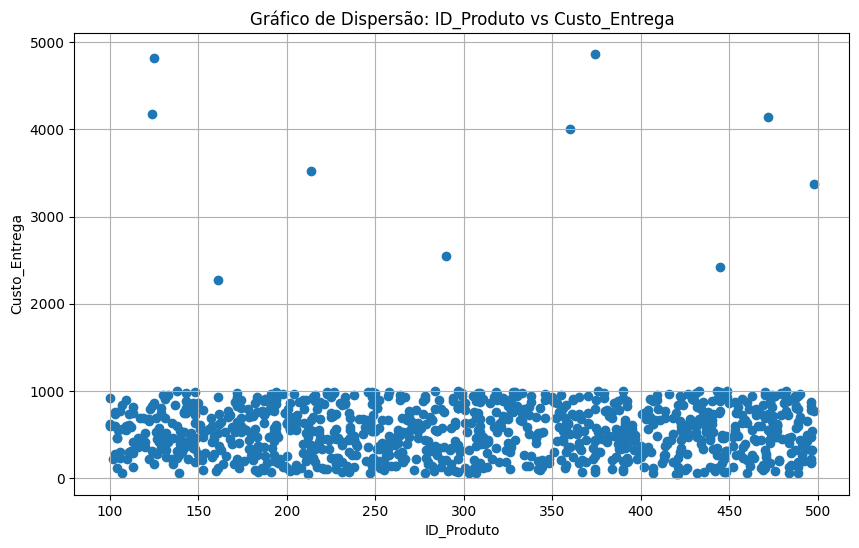

In [ ]:
# Exibir Metadados
print("\nTipos de Dados das Colunas:")
print(dataset.dtypes)

# Plotar por custo_entrega
plt.figure(figsize=(10, 6))
plt.scatter(dataset['ID_Produto'], dataset['Custo_Entrega'])
plt.xlabel('ID_Produto')
plt.ylabel('Custo_Entrega')
plt.title('Gráfico de Dispersão: ID_Produto vs Custo_Entrega')
plt.grid(True)
plt.show()

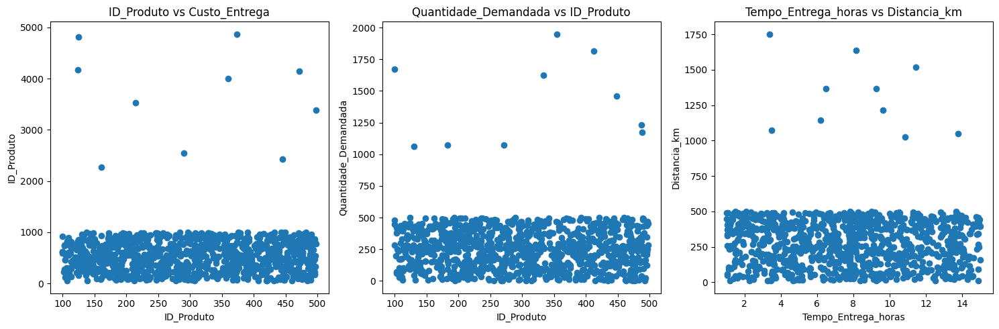

In [ ]:
# Criar gráficos de dispersão para 'Custo_Entrega', 'Quantidade_Demandada' e 'Capacidade_Armazem' versus 'Matricula'
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.scatter(dataset['ID_Produto'], dataset['Custo_Entrega'])
plt.xlabel('ID_Produto')
plt.ylabel('ID_Produto')
plt.title('ID_Produto vs Custo_Entrega')

plt.subplot(1, 3, 2)
plt.scatter(dataset['ID_Produto'], dataset['Quantidade_Demandada'])
plt.xlabel('ID_Produto')
plt.ylabel('Quantidade_Demandada')
plt.title('Quantidade_Demandada vs ID_Produto')

plt.subplot(1, 3, 3)
plt.scatter(dataset['Tempo_Entrega_horas'], dataset['Distancia_km'])
plt.xlabel('Tempo_Entrega_horas')
plt.ylabel('Distancia_km')
plt.title('Tempo_Entrega_horas vs Distancia_km')

plt.tight_layout()
plt.show()

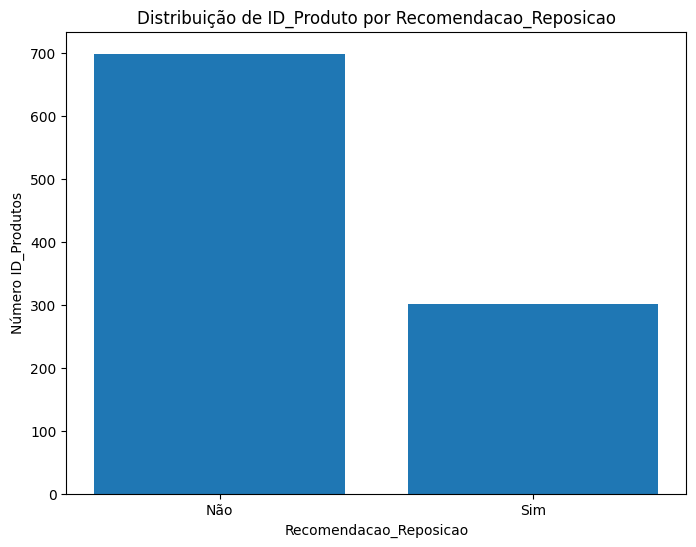

In [ ]:
# Distribuicoes
# Contar a quantidade de ID_Produto por Recomendacao_Reposicao
reposicao_counts = dataset['Recomendacao_Reposicao'].value_counts()

# Criar o gráfico de barras
plt.figure(figsize=(8, 6))
plt.bar(reposicao_counts.index, reposicao_counts.values)
plt.xlabel('Recomendacao_Reposicao')
plt.ylabel('Número ID_Produtos')
plt.title('Distribuição de ID_Produto por Recomendacao_Reposicao')
plt.show()

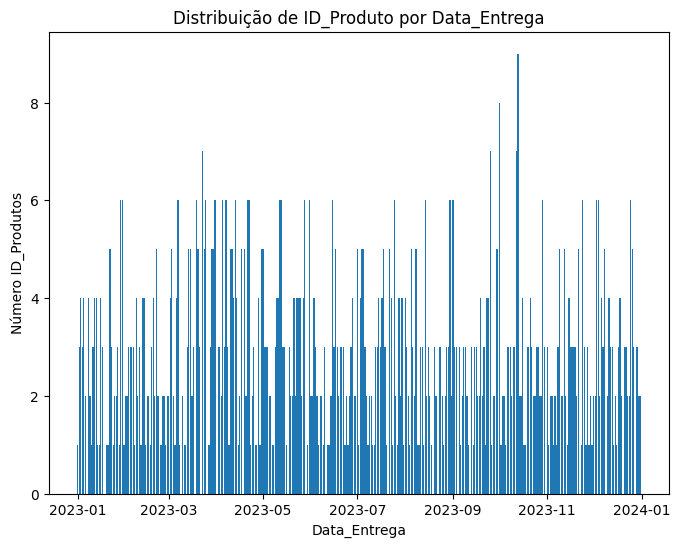

In [ ]:
# Distribuicoes
# Contar a quantidade de ID_Produto por Data_Entrega
reposicao_counts = dataset['Data_Entrega'].value_counts()

# Criar o gráfico de barras
plt.figure(figsize=(8, 6))
plt.bar(reposicao_counts.index, reposicao_counts.values)
plt.xlabel('Data_Entrega')
plt.ylabel('Número ID_Produtos')
plt.title('Distribuição de ID_Produto por Data_Entrega')
plt.show()

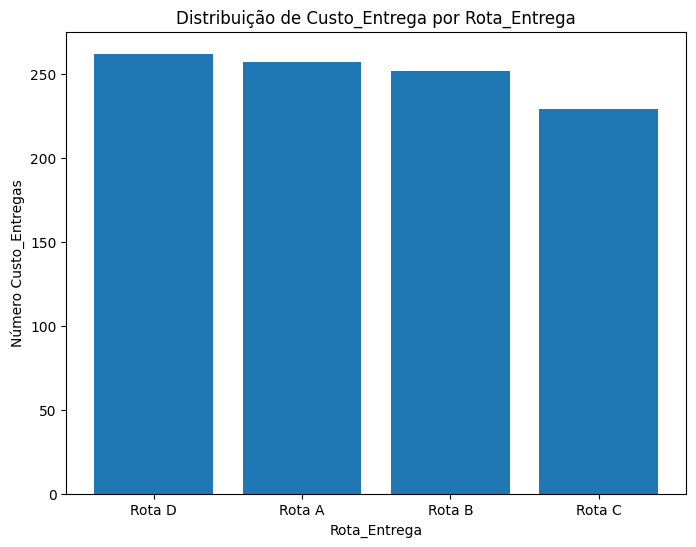

In [ ]:
# Distribuicoes
# Contar a quantidade de Custo_Entrega por Rota_Entrega
genero_counts = dataset['Rota_Entrega'].value_counts()

# Criar o gráfico de barras
plt.figure(figsize=(8, 6))
plt.bar(genero_counts.index, genero_counts.values)
plt.xlabel('Rota_Entrega')
plt.ylabel('Número Custo_Entregas')
plt.title('Distribuição de Custo_Entrega por Rota_Entrega')
plt.show()

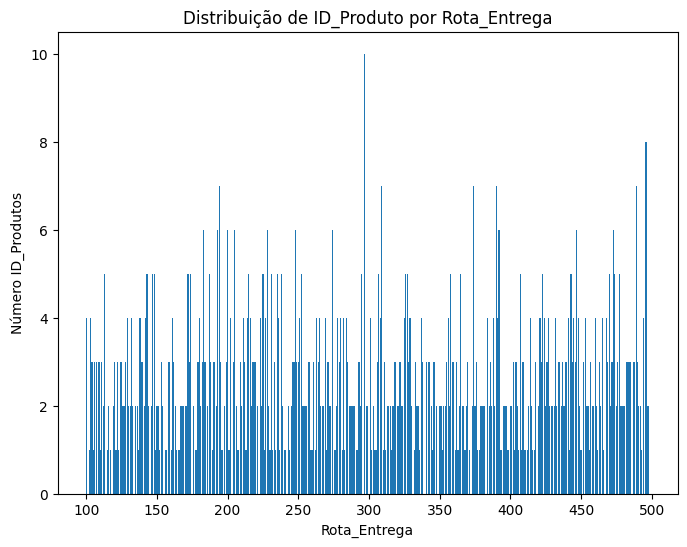

In [ ]:
# Contar a quantidade de ID_Produto por Rota_Entrega
genero_counts = dataset['ID_Produto'].value_counts()

# Criar o gráfico de barras
plt.figure(figsize=(8, 6))
plt.bar(genero_counts.index, genero_counts.values)
plt.xlabel('Rota_Entrega')
plt.ylabel('Número ID_Produtos')
plt.title('Distribuição de ID_Produto por Rota_Entrega')
plt.show()

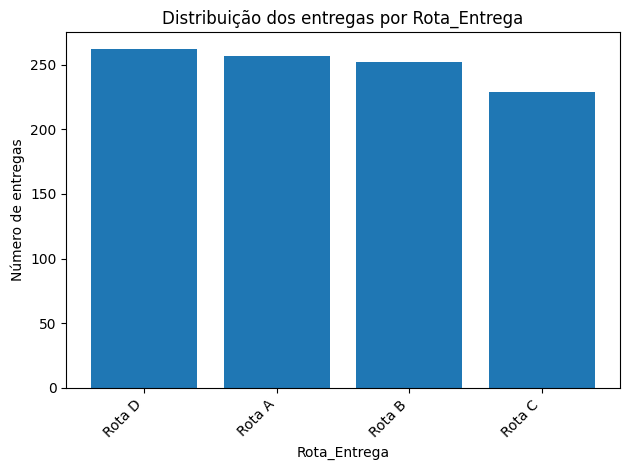

In [ ]:
# Gráfico de barras para 'Rota_Entrega'
Rota_Entrega_counts = dataset['Rota_Entrega'].value_counts()
plt.bar(Rota_Entrega_counts.index, Rota_Entrega_counts.values)
plt.xlabel('Rota_Entrega')
plt.ylabel('Número de entregas')
plt.title('Distribuição dos entregas por Rota_Entrega')
plt.xticks(rotation=45, ha='right')  # Rotacionar rótulos do eixo x para melhor visualização
plt.tight_layout()
plt.show()

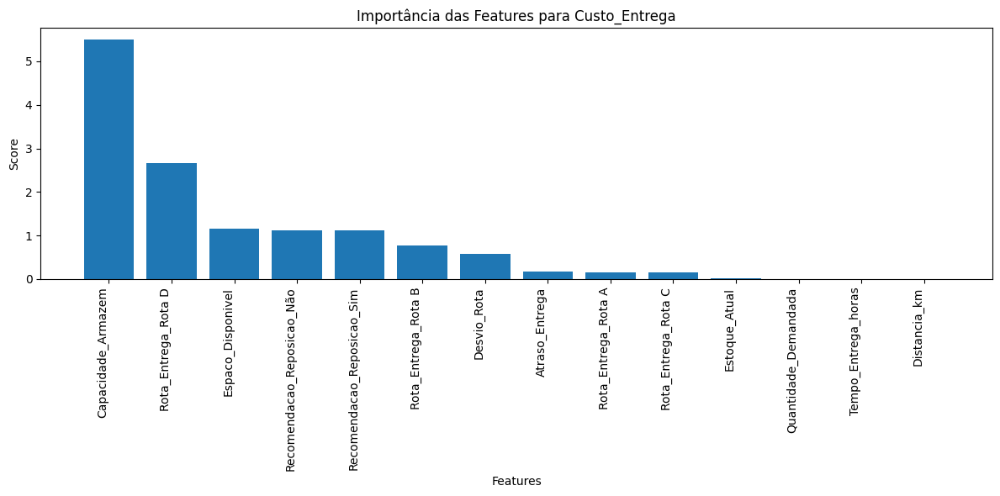

In [ ]:
# Selecionar features relevantes para análise, excluindo 'ID_Produto' e 'Data_Entrega'
features = dataset.drop(['ID_Produto', 'Data_Entrega', 'Custo_Entrega'], axis=1)
target = dataset['Custo_Entrega']

# Converter variáveis categóricas para numéricas usando one-hot encoding
features = pd.get_dummies(features)

# Selecionar as melhores features usando SelectKBest e f_regression
selector = SelectKBest(score_func=f_regression, k='all')
X_new = selector.fit_transform(features, target)

# Criar um DataFrame com as features selecionadas e seus scores
scores = pd.DataFrame({'Feature': features.columns, 'Score': selector.scores_})
scores = scores.sort_values(by='Score', ascending=False)


# Criar o gráfico de barras
plt.figure(figsize=(12, 6))
plt.bar(scores['Feature'], scores['Score'])
plt.xlabel('Features')
plt.ylabel('Score')
plt.title('Importância das Features para Custo_Entrega')
plt.xticks(rotation=90, ha='right')
plt.tight_layout()
plt.show()

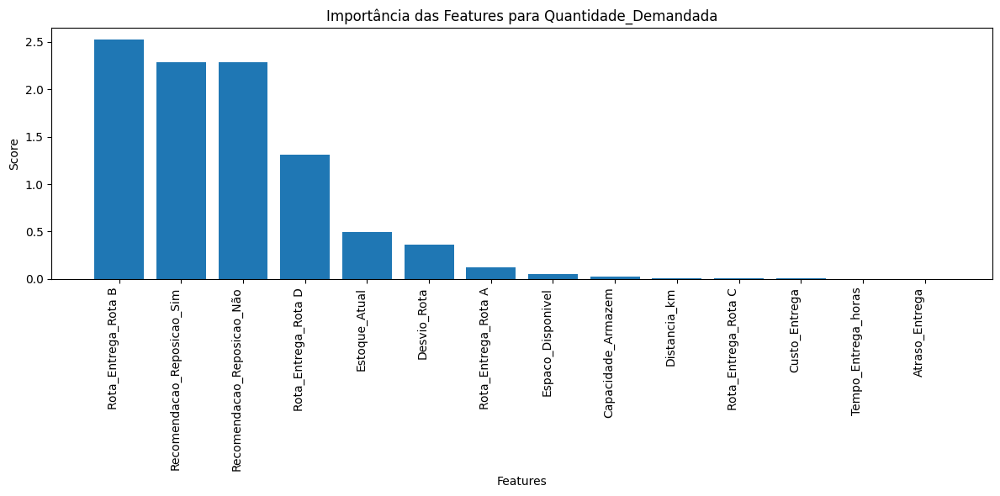

In [ ]:
# Selecionar features relevantes para análise, excluindo 'ID_Produto' e 'Data_Entrega'
features = dataset.drop(['ID_Produto', 'Data_Entrega', 'Quantidade_Demandada'], axis=1)
target = dataset['Quantidade_Demandada']

# Converter variáveis categóricas para numéricas usando one-hot encoding
features = pd.get_dummies(features)

# Selecionar as melhores features usando SelectKBest e f_regression
selector = SelectKBest(score_func=f_regression, k='all')
X_new = selector.fit_transform(features, target)

# Criar um DataFrame com as features selecionadas e seus scores
scores = pd.DataFrame({'Feature': features.columns, 'Score': selector.scores_})
scores = scores.sort_values(by='Score', ascending=False)


# Criar o gráfico de barras
plt.figure(figsize=(12, 6))
plt.bar(scores['Feature'], scores['Score'])
plt.xlabel('Features')
plt.ylabel('Score')
plt.title('Importância das Features para Quantidade_Demandada')
plt.xticks(rotation=90, ha='right')
plt.tight_layout()
plt.show()

# Etapa 6: Identificação dos Outliers

Calcular Contaminação

Explicação: Para calcular o percentual de contaminação de outliers em um dataset, se pode usar o método InterQuartile Range (IQR) que serve para identificar os valores atípicos em cada coluna numérica. O IQR define outliers como valores que estão:

Abaixo de Q1 - 1.5 x IQR

ou

Acima de Q3 + 1.5 x IQR

In [ ]:
# Definir o limite
limite = 1.5

# Selecionar apenas colunas numéricas
numeric_cols = dataset.select_dtypes(include='number')

# Inicializar contador de outliers
outlier_counts = 0
total_values = numeric_cols.size

# Detectar outliers usando o método IQR para cada coluna numérica
for col in numeric_cols.columns:
    Q1 = numeric_cols[col].quantile(0.25)
    Q3 = numeric_cols[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - limite * IQR
    upper_bound = Q3 + limite * IQR

    # Contar outliers
    col_outliers = numeric_cols[(numeric_cols[col] < lower_bound) | (numeric_cols[col] > upper_bound)][col].count()
    outlier_counts += col_outliers
    print(f"Coluna '{col}' - Outliers: {col_outliers} ({(col_outliers / len(dataset) * 100):.2f}%)")

# Calcular o percentual de contaminação de outliers no dataset
outlier_percentage = (outlier_counts / total_values) * 100

print(f"\nPercentual de contaminação de outliers no dataset: {outlier_percentage:.2f}%")
print(f"Percentual de contaminação de outliers no dataset: {outlier_percentage/100:.4f}%")

Coluna 'Quantidade_Demandada' - Outliers: 10 (1.00%)
Coluna 'Estoque_Atual' - Outliers: 0 (0.00%)
Coluna 'Capacidade_Armazem' - Outliers: 0 (0.00%)
Coluna 'Espaco_Disponivel' - Outliers: 0 (0.00%)
Coluna 'Distancia_km' - Outliers: 10 (1.00%)
Coluna 'Tempo_Entrega_horas' - Outliers: 0 (0.00%)
Coluna 'Custo_Entrega' - Outliers: 10 (1.00%)

Percentual de contaminação de outliers no dataset: 0.43%
Percentual de contaminação de outliers no dataset: 0.0043%


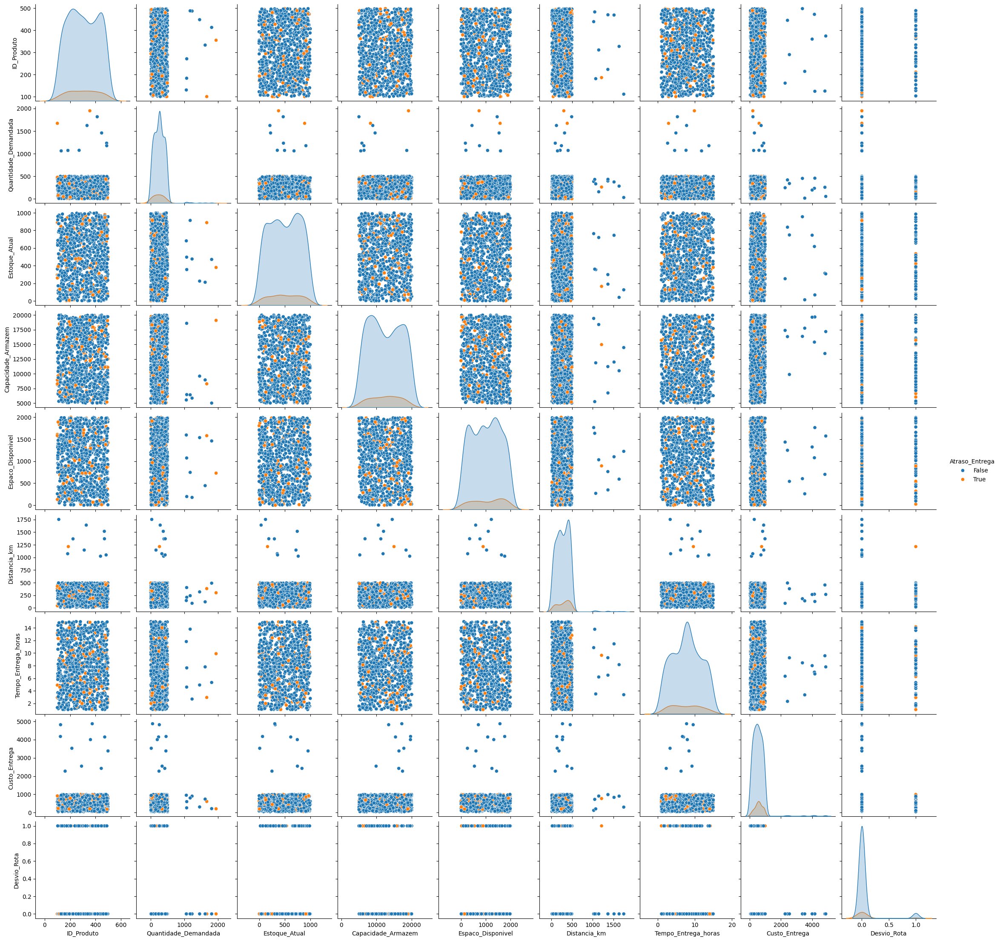

In [ ]:
# Atraso_Entrega
sns.pairplot(data = dataset, hue = 'Atraso_Entrega')

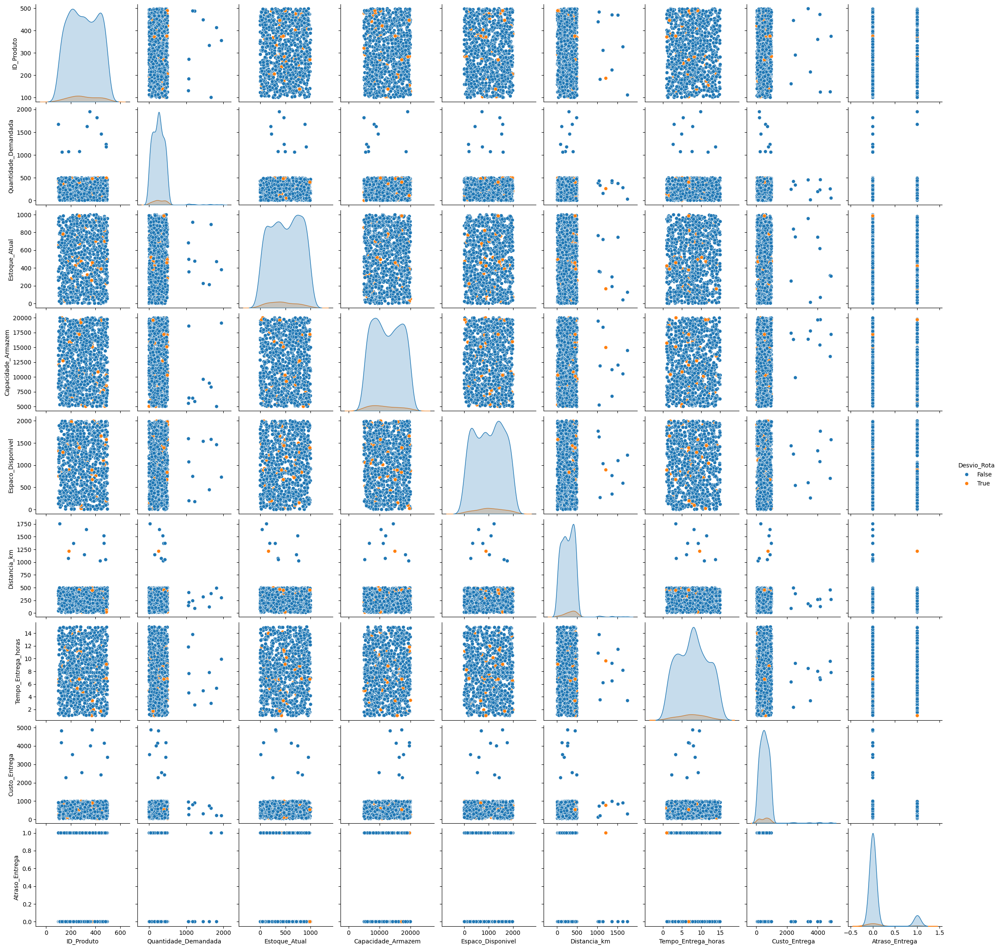

In [ ]:
sns.pairplot(data = dataset, hue = 'Desvio_Rota')

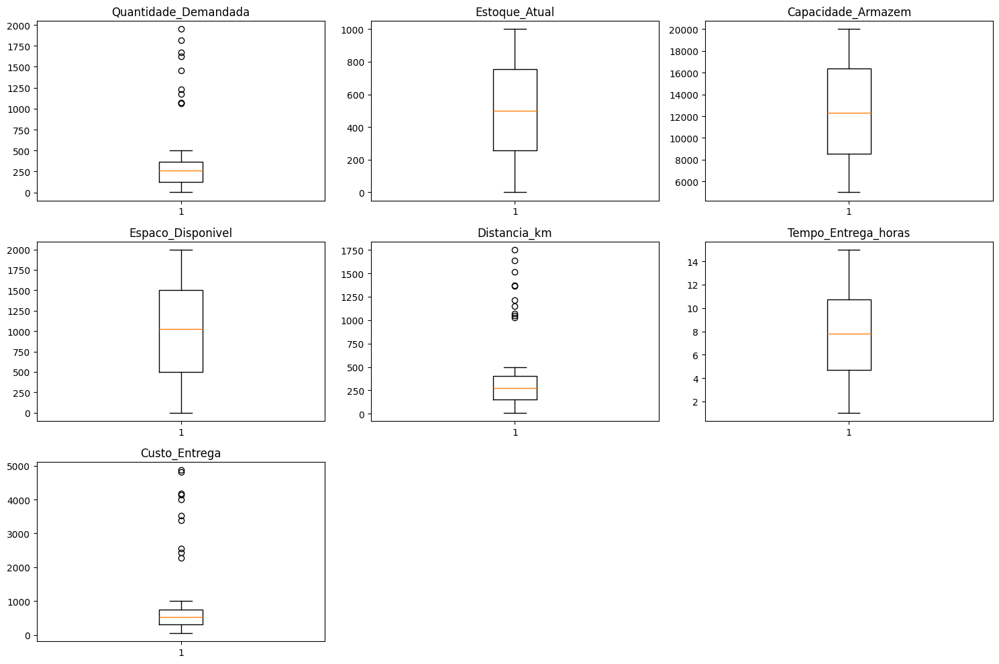

In [ ]:
# Criar boxplot para cada coluna numérica para visualizar outliers
plt.figure(figsize=(15, 10))
for i, col in enumerate(dataset.select_dtypes(include='number').columns):
    plt.subplot(3, 3, i + 1)
    plt.boxplot(dataset[col])
    plt.title(col)

plt.tight_layout()
plt.show()

**Visualização da distribuição dos dados outliers e inliners**

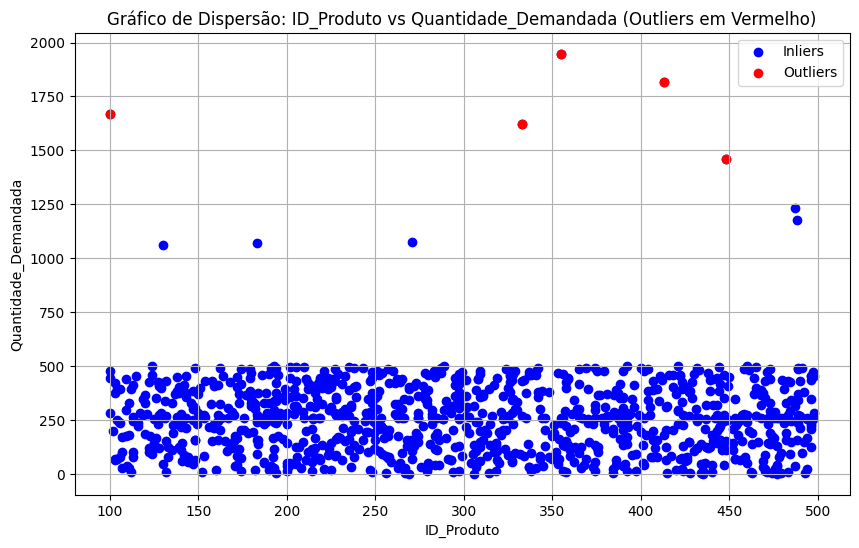

In [ ]:
# Criar modelo IsolationForest para detectar outliers
model = IsolationForest(contamination=outlier_percentage/100)  # Ajustar a contaminação conforme necessário
model.fit(dataset[['Quantidade_Demandada']])

# Prever se cada ponto é um outlier (-1) ou um inlier (1)
outlier_predictions = model.predict(dataset[['Quantidade_Demandada']])

# Criar um gráfico de dispersão com os outliers destacados
plt.figure(figsize=(10, 6))
plt.scatter(dataset['ID_Produto'], dataset['Quantidade_Demandada'], color='blue', label='Inliers')
plt.scatter(dataset['ID_Produto'][outlier_predictions == -1], dataset['Quantidade_Demandada'][outlier_predictions == -1], color='red', label='Outliers')
plt.xlabel('ID_Produto')
plt.ylabel('Quantidade_Demandada')
plt.title('Gráfico de Dispersão: ID_Produto vs Quantidade_Demandada (Outliers em Vermelho)')
plt.legend()
plt.grid(True)
plt.show()

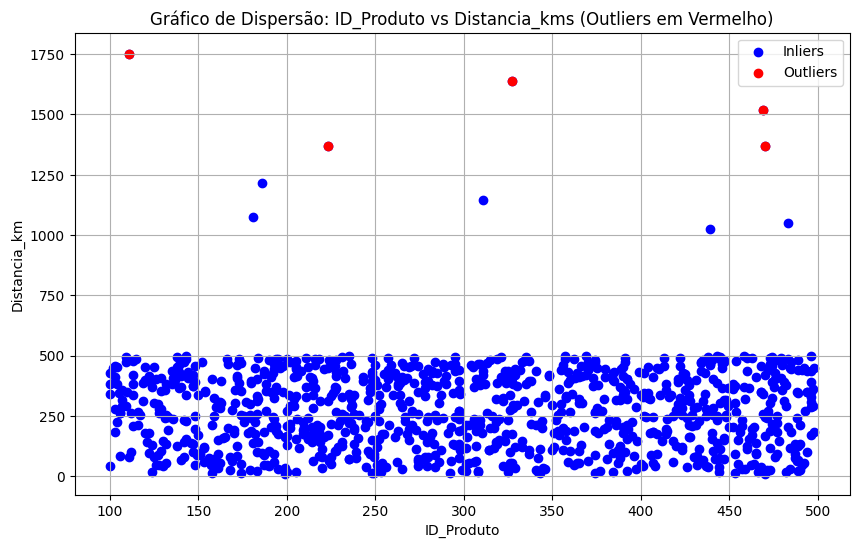

In [ ]:
# Criar modelo IsolationForest para detectar outliers
model = IsolationForest(contamination=outlier_percentage/100)  # Ajustar a contaminação conforme necessário
model.fit(dataset[['Distancia_km']])

# Prever se cada ponto é um outlier (-1) ou um inlier (1)
outlier_predictions = model.predict(dataset[['Distancia_km']])

# Criar gráfico de dispersão com os outliers destacados
plt.figure(figsize=(10, 6))
plt.scatter(dataset['ID_Produto'], dataset['Distancia_km'], color='blue', label='Inliers')
plt.scatter(dataset['ID_Produto'][outlier_predictions == -1], dataset['Distancia_km'][outlier_predictions == -1], color='red', label='Outliers')
plt.xlabel('ID_Produto')
plt.ylabel('Distancia_km')
plt.title('Gráfico de Dispersão: ID_Produto vs Distancia_kms (Outliers em Vermelho)')
plt.legend()
plt.grid(True)
plt.show()

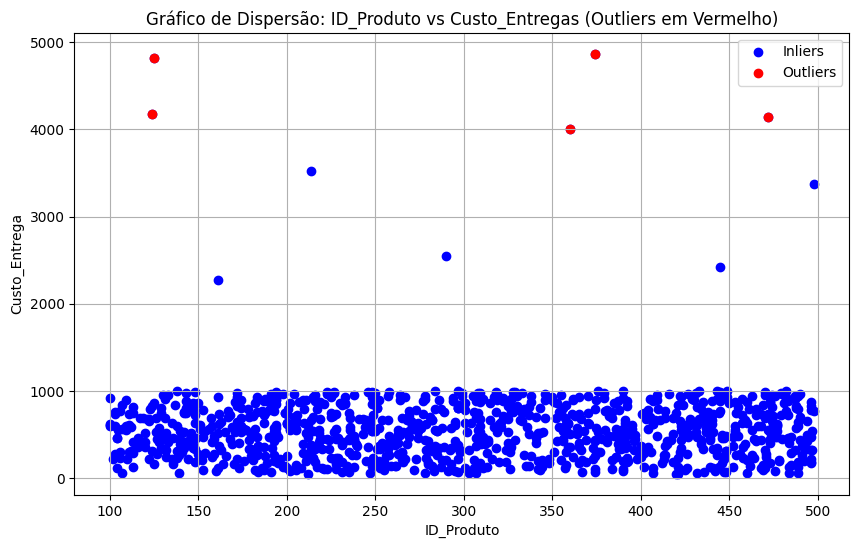

In [ ]:
# Criar modelo IsolationForest para detectar outliers
model = IsolationForest(contamination=outlier_percentage/100)  # Ajustar a contaminação conforme necessário
model.fit(dataset[['Custo_Entrega']])

# Prever se cada ponto é um outlier (-1) ou um inlier (1)
outlier_predictions = model.predict(dataset[['Custo_Entrega']])

# Criar gráfico de dispersão com os outliers destacados
plt.figure(figsize=(10, 6))
plt.scatter(dataset['ID_Produto'], dataset['Custo_Entrega'], color='blue', label='Inliers')
plt.scatter(dataset['ID_Produto'][outlier_predictions == -1], dataset['Custo_Entrega'][outlier_predictions == -1], color='red', label='Outliers')
plt.xlabel('ID_Produto')
plt.ylabel('Custo_Entrega')
plt.title('Gráfico de Dispersão: ID_Produto vs Custo_Entregas (Outliers em Vermelho)')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Contar a quantidade de valores negativos em cada coluna numérica
negative_counts = (dataset.select_dtypes(include='number') < 0).sum()

# Exibir a quantidade de valores negativos por coluna
print("\nQuantidade de valores negativos por coluna:")
print(negative_counts)

# Exibir o total de valores negativos no dataset
total_negative_values = negative_counts.sum()
print(f"\nTotal de valores negativos no dataset: {total_negative_values}")


Quantidade de valores negativos por coluna:
Quantidade_Demandada    0
Estoque_Atual           0
Capacidade_Armazem      0
Espaco_Disponivel       0
Distancia_km            0
Tempo_Entrega_horas     0
Custo_Entrega           0
dtype: int64

Total de valores negativos no dataset: 0


**Separação dos Outliers dos Inliers**

In [ ]:
# Selecionar apenas colunas numéricas para a detecção de outliers
numeric_data = dataset.select_dtypes(include='number')

# Configurar e aplicar o Isolation Forest com contaminação
iso_forest = IsolationForest(contamination=0.0365, random_state=42)
outlier_labels = iso_forest.fit_predict(numeric_data)

# Adicionar os rótulos de outliers ao dataset
dataset['is_outlier'] = outlier_labels

# Filtrar apenas os outliers (rótulo -1)
outliers = dataset[dataset['is_outlier'] == -1]

# Exibir os dados que são outliers
print("Dados identificados como outliers:")
print(outliers.to_string())

# Exibir a quantidade e percentual de outliers detectados
outlier_count = len(outliers)
outlier_percentage = (outlier_count / len(dataset)) * 100
print(f"\nTotal de outliers: {outlier_count} ({outlier_percentage:.2f}%)")

Dados identificados como outliers:
    ID_Produto Data_Entrega  Quantidade_Demandada  Estoque_Atual Recomendacao_Reposicao  Capacidade_Armazem  Espaco_Disponivel Rota_Entrega  Distancia_km  Tempo_Entrega_horas  Custo_Entrega  Atraso_Entrega  Desvio_Rota  is_outlier
40         498   2023-09-19                 452.0            956                    Não               16367                603       Rota D        181.93             8.450000        3379.73           False        False          -1
57         153   2023-01-22                  81.0            711                    Sim                5293                782       Rota D         58.60             1.040000          94.18           False        False          -1
110        469   2023-06-15                 373.0            745                    Não               11994               1101       Rota C       1516.89            11.460000         836.49           False        False          -1
135        327   2023-03-20              

In [ ]:
# Remover os outliers
try:
    dataset = dataset[dataset['is_outlier'] == 1].drop(columns=['is_outlier'])
except Exception as e:
    print(f"Ocorreu um erro: {e}")

# Exibir o dataset sem os outliers
print("Dataset sem os outliers:")
print(dataset.to_string())

# Exibir informações gerais do dataset
print("\nInformações Gerais do Dataset:")
print(dataset.info())

Dataset sem os outliers:
    ID_Produto Data_Entrega  Quantidade_Demandada  Estoque_Atual Recomendacao_Reposicao  Capacidade_Armazem  Espaco_Disponivel Rota_Entrega  Distancia_km  Tempo_Entrega_horas  Custo_Entrega  Atraso_Entrega  Desvio_Rota
0          272   2023-08-05            407.000000            984                    Não               17968               1864       Rota D        387.75            12.270000          94.25           False        False
1          147   2023-09-30            383.000000            778                    Não               11776               1392       Rota B        100.11             5.070000         340.85            True        False
2          217   2023-12-22            348.000000            121                    Sim               12661                871       Rota B        211.59            12.000000         125.82           False        False
3          292   2023-06-17            314.000000            299                    Não            

# Etapa 7: Clusterização

**Técnicas para identificação do hiperparametro K**

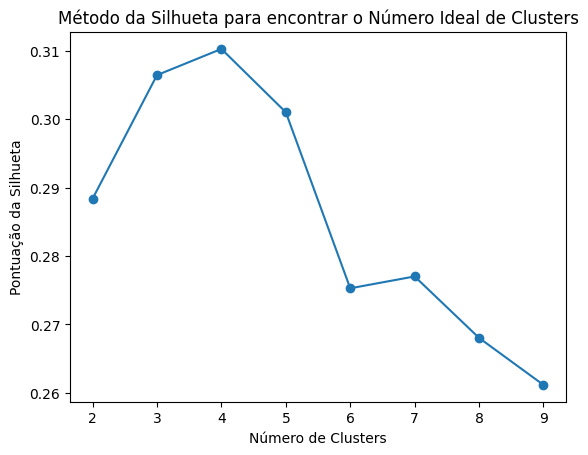

Melhor valor de K (Método da Silhueta): 4


In [ ]:
# Selecionar as colunas numéricas relevantes para a clusterização
features_cluster = dataset[['Quantidade_Demandada', 'Distancia_km', 'Custo_Entrega']]

# Normalizar os dados
scaler = MinMaxScaler()
features_cluster = scaler.fit_transform(features_cluster)

# Encontrar o número ótimo de clusters usando a técnica de silhueta
silhouette_scores = []
for n_clusters in range(2, 10):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(features_cluster)
    silhouette_avg = silhouette_score(features_cluster, labels)
    silhouette_scores.append(silhouette_avg)

# Plotar os resultados da silhueta
plt.plot(range(2, 10), silhouette_scores, marker='o')
plt.xlabel('Número de Clusters')
plt.ylabel('Pontuação da Silhueta')
plt.title('Método da Silhueta para encontrar o Número Ideal de Clusters')
plt.show()

# Encontrar o número de clusters com a maior pontuação de silhueta
best_n_clusters = np.argmax(silhouette_scores) + 2

# print(f"O número ideal de clusters é: {best_n_clusters}")

# Encontrar o melhor valor de K (o ponto de inflexão no gráfico)
# Pode ser feito visualmente ou usando alguma técnica de detecção de inflexão
# Neste exemplo, vamos usar a visualização para determinar o melhor K
# O melhor K parece ser 3, mas isso depende do gráfico gerado.
# best_k = np.argmax(np.diff(inertia) * -1) + 2
print(f"Melhor valor de K (Método da Silhueta): {best_n_clusters}")

# Algoritmo de Clusterização (KMeans)

In [ ]:
# Definir os hiperparâmetros do KMeans
n_clusters = best_n_clusters  # Número de clusters (K)
max_iter = 200  # Número máximo de iterações
init = 'k-means++'  # Método de inicialização dos centróides
n_init = 10  # Número de vezes que o algoritmo KMeans será executado com diferentes inicializações
algorithm = 'lloyd' # Algoritmo para calcular os centróides ('lloyd' ou 'elkan' ou 'auto')

# Criar o modelo KMeans com os hiperparâmetros definidos
kmeans = KMeans(n_clusters=n_clusters, max_iter=max_iter, init=init, n_init=n_init, algorithm=algorithm, random_state=42)

# Selecionar as colunas numéricas relevantes para a clusterização
features_cluster = dataset[['Quantidade_Demandada', 'Distancia_km', 'Custo_Entrega']]

# Normalizar os dados (opcional, mas recomendado para KMeans)
scaler = MinMaxScaler()
features_cluster = scaler.fit_transform(features_cluster)

# Executar a clusterização
kmeans.fit(features_cluster)

# Obter as etiquetas dos clusters para cada ponto de dados
labels = kmeans.labels_

# Obter as coordenadas dos centróides dos clusters
centroids = kmeans.cluster_centers_

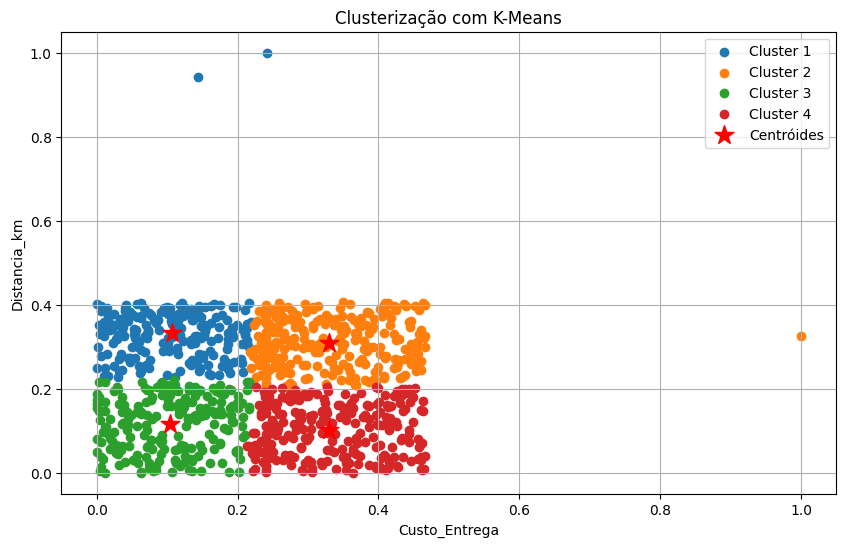

In [ ]:
# Criar o gráfico de dispersão
plt.figure(figsize=(10, 6))

# Plotar os dados de cada cluster com cores diferentes
for i in range(n_clusters):
  plt.scatter(features_cluster[labels == i, 0], features_cluster[labels == i, 1], label=f'Cluster {i+1}')

# Plotar os centróides dos clusters com um marcador especial (estrela)
plt.scatter(centroids[:, 0], centroids[:, 1], marker='*', s=200, c='red', label='Centróides')

plt.xlabel('Custo_Entrega')
plt.ylabel('Distancia_km')
plt.title('Clusterização com K-Means')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Exibir os dados referentes a cada cluster de forma dinâmica (opcional)
for i in range(4):
  print(f"\nDados do Cluster {i+1}:")
  cluster_data = dataset[labels == i]
  print(cluster_data.describe().to_string())


Dados do Cluster 1:
              Data_Entrega  Quantidade_Demandada  Estoque_Atual  Capacidade_Armazem  Espaco_Disponivel  Distancia_km  Tempo_Entrega_horas  Custo_Entrega
count                  216            216.000000     216.000000          216.000000         216.000000    216.000000           216.000000     216.000000
mean   2023-07-01 21:33:20            115.657407     474.268519        12482.990741        1069.759259    411.973056             7.266191     530.937639
min    2023-01-02 00:00:00              1.000000       2.000000         5013.000000           2.000000    283.810000             1.030000      53.410000
25%    2023-04-05 00:00:00             57.750000     234.750000         8600.500000         575.000000    358.172500             4.167500     313.247500
50%    2023-07-03 00:00:00            119.000000     428.000000        12646.000000        1032.500000    411.330000             7.730000     522.235000
75%    2023-09-29 12:00:00            167.750000     745.0000

In [ ]:
# Exibir os dados dos clusters
for i in range(4):  # Itere pelos clusters (assumindo 4 clusters)
  print(f"\nHead do Cluster {i+1}:")
  cluster_data = dataset[labels == i].head()
  print(cluster_data.to_string())


Head do Cluster 1:
   ID_Produto Data_Entrega  Quantidade_Demandada  Estoque_Atual Recomendacao_Reposicao  Capacidade_Armazem  Espaco_Disponivel Rota_Entrega  Distancia_km  Tempo_Entrega_horas  Custo_Entrega  Atraso_Entrega  Desvio_Rota
12        392   2023-05-15                 170.0            291                    Sim               19927                 30       Rota B        318.22             5.210000         487.89           False        False
16        496   2023-02-13                 233.0            600                    Sim               15094               1948       Rota C        497.43            13.670000         220.15           False        False
19        139   2023-10-06                 123.0            324                    Sim               18372                791       Rota C        366.94             5.600000         449.86           False        False
35        277   2023-10-22                 222.0            970                    Não               13506  

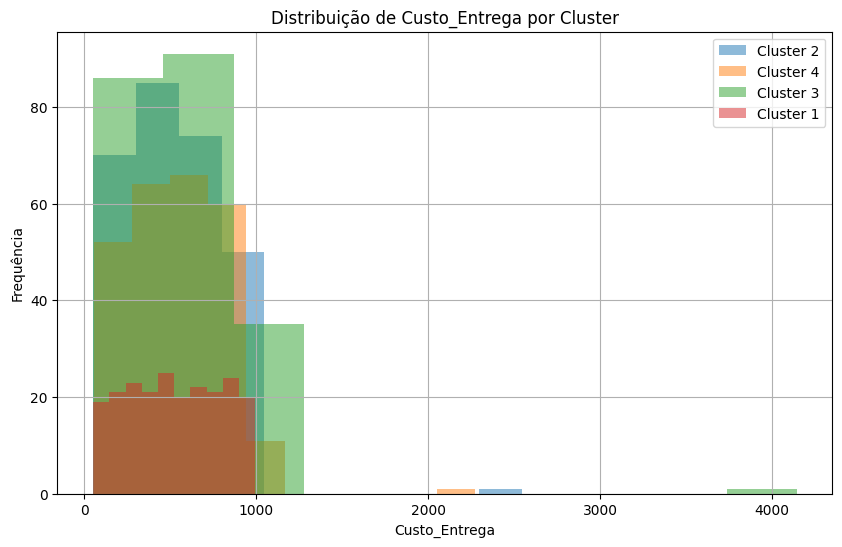

In [ ]:
# Adicionar a coluna de clusters ao dataset
dataset['Cluster'] = labels

# Criar o gráfico de distribuição dos Custo_Entrega por cluster
plt.figure(figsize=(10, 6))
for cluster in dataset['Cluster'].unique():
  plt.hist(dataset[dataset['Cluster'] == cluster]['Custo_Entrega'], alpha=0.5, label=f'Cluster {cluster + 1}')

plt.xlabel('Custo_Entrega')
plt.ylabel('Frequência')
plt.title('Distribuição de Custo_Entrega por Cluster')
plt.legend()
plt.grid(True)
plt.show()

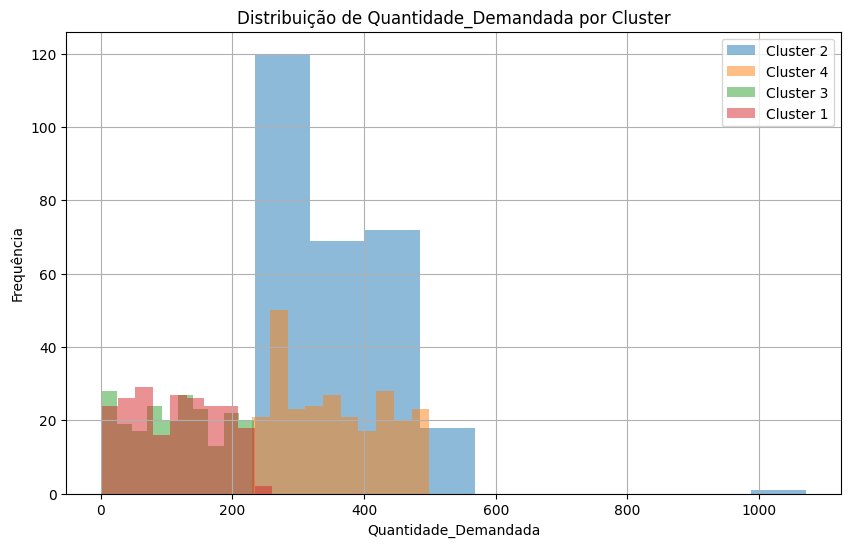

In [ ]:
# Adicionar a coluna de clusters ao dataset
dataset['Cluster'] = labels

# Criar o gráfico de distribuição dos Quantidade_Demandada  por cluster
plt.figure(figsize=(10, 6))
for cluster in dataset['Cluster'].unique():
  plt.hist(dataset[dataset['Cluster'] == cluster]['Quantidade_Demandada'], alpha=0.5, label=f'Cluster {cluster + 1}')

plt.xlabel('Quantidade_Demandada')
plt.ylabel('Frequência')
plt.title('Distribuição de Quantidade_Demandada por Cluster')
plt.legend()
plt.grid(True)
plt.show()

# SVM SUPORT VECTOR MACHINE

In [ ]:
#definindo amostragem

features_cluster = dataset[['Quantidade_Demandada', 'Distancia_km', 'Custo_Entrega']]

from sklearn.model_selection import train_test_split
X = dataset[['Quantidade_Demandada', 'Distancia_km', 'Custo_Entrega']]
y = dataset['Atraso_Entrega']
#separando amostragem  80/20
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
modelo = SVC(random_state=42, kernel="poly") #random state 42 pra sempre 'splitar' da mesma forma
modelo.fit(X_train, y_train)

# Selecionar as colunas numéricas relevantes para a clusterização
features_cluster = dataset[['Quantidade_Demandada', 'Distancia_km', 'Custo_Entrega']]

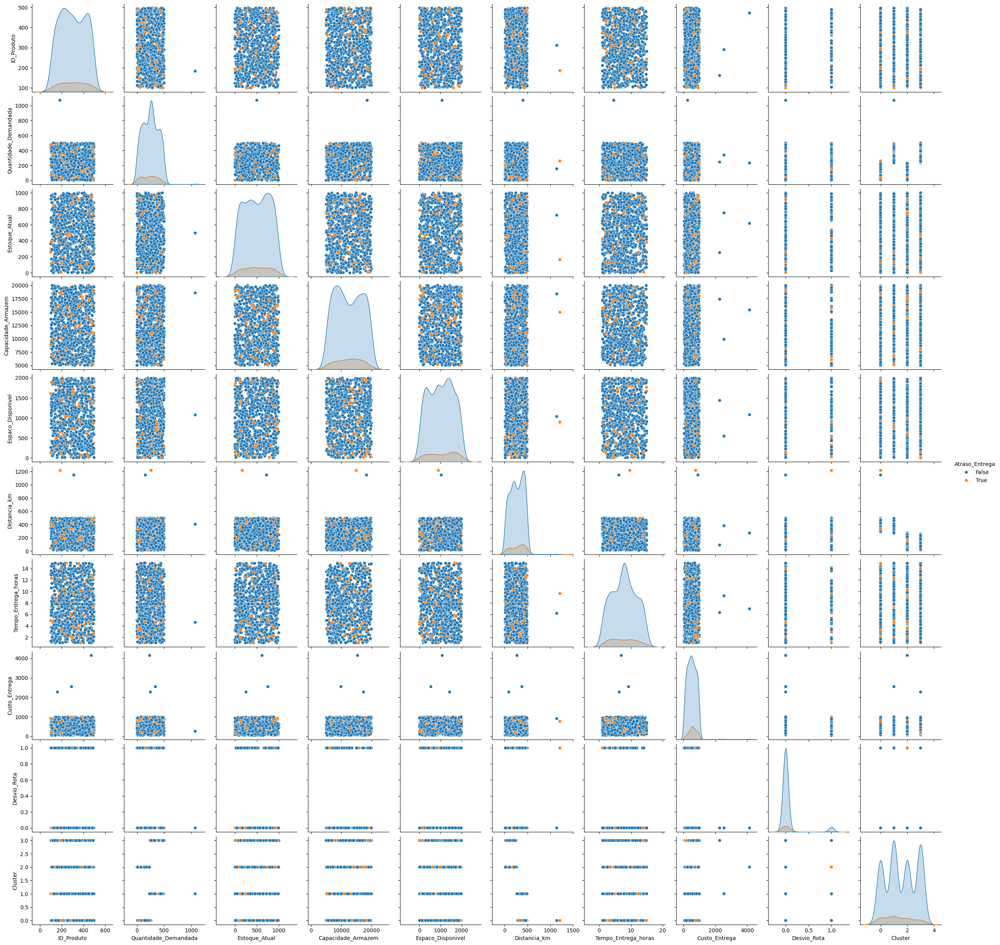

In [ ]:
sns.pairplot(data = dataset, hue = 'Atraso_Entrega')